### Análisis de COVID-19 en Argentina, Chile y Brasil

# Índice


* [1 - Imports](#1)
* [2 - Casos de contagios confirmados de COVID-19](#2)
 * [2.1 - Cargamos los datos](#2.1)
 * [2.2 - Procesamos los datos obtenidos](#2.2)
 * [2.3 - Analizamos el dataset para Argentina, Chile y Brasil](#2.3)
* [3 - Casos de muertes por COVID-19](#3)
 * [3.1 - Cargamos los datos](#3.1)
 * [3.2 - Procesamos los datos obtenidos](#3.2)
 * [3.3 - Analizamos el dataset para Argentina, Chile y Brasil](#3.3)
* [4 - Predicciones](#4)
 * [4.1 - Predicción de muertes por COVID-19](#4.1)
  * [4.1.1 - Argentina](#4.1.1)
  * [4.1.2 - Chile](#4.1.2)
  * [4.1.3 - Brasil](4.1.3)
 * [4.2 - Predicción de contagios por COVID-19](#4.2)
  * [4.2.1 - Argentina](#4.2.1)
  * [4.2.2 - Chile](#4.2.2)
  * [4.2.3 - Brasil](#4.2.3)
* [5 - Ideas de mejoras](#5)

# 1 - Imports <a id="1"></a>

In [1860]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np 
sns.set_style('darkgrid')

# 2 - Casos de contagios confirmados de COVID19 <a id="2"></a>

#### Nuestro dataframe tendrá los casos de personas infectadas de COVID-19 en todos los países del mundo

## 2.1 - Cargamos los datos <a id="2.1"></a>

In [1861]:
confirmed_cases = pd.read_csv("time_series_covid19_confirmed_global.csv")

In [1862]:
confirmed_cases.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,946,948,949,964,969,981,989,998,1004,1029
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,761,761,761,762,762,762,762,762,763,763
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,48,50,52,52,58,60,61,69,70,70


## 2.2 - Procesamos los datos obtenidos <a id="2.2"></a>

Como nos vamos a concentrar en la cantidad de contagios a lo largo de los días por país, vamos a eliminar las columnas que no nos dan información relevante para nuestro análisis.

In [1863]:
confirmed_cases = confirmed_cases.drop(["Province/State", "Lat", "Long"], axis=1)

Para poder trabajar mejor los datos y poder hacer un análisis de la cantidad de contagios en función de los días vamos a trasponer nuestro dataframe y trabajarlo un poco.

In [1864]:
confirmed_cases = confirmed_cases.transpose()

In [1865]:
confirmed_cases.columns=confirmed_cases.loc["Country/Region"].values

In [1866]:
confirmed_cases.drop("Country/Region", inplace = True)

Ahora tenemos listo nuestro dataframe. Demos un vistazo como quedó

In [1867]:
confirmed_cases

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Australia,...,Malawi,United Kingdom,France,South Sudan,Western Sahara,Sao Tome and Principe,Yemen,Comoros,Tajikistan,Lesotho
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5/22/20,9216,981,7918,762,60,25,10649,5928,107,3086,...,82,13,1,563,6,251,209,78,2551,2
5/23/20,9998,989,8113,762,61,25,11353,6302,107,3087,...,82,13,1,655,6,251,212,78,2738,2
5/24/20,10582,998,8306,762,69,25,12076,6661,107,3090,...,83,13,1,655,9,251,222,87,2929,2
5/25/20,11173,1004,8503,763,70,25,12628,7113,107,3092,...,101,13,1,806,9,299,233,87,3100,2


## 2.3 - Analizamos el dataset para Argentina, Chile y Brasil  <a id="2.3"></a>

Vamos a concentrar nuestro análisis de contagios en Argentina, Chile y Brasil ya que son países que comenzaron con casos de coronavirus en un tiempo similar, están atravesando las mismas condiciones de temperatura y han tomado distintas medidas preventivas contra el avance del virus.

In [1868]:
#Seleccionamos las columnas a analizar

argentina_cases=confirmed_cases["Argentina"]
chile_cases=confirmed_cases["Chile"]
brazil_cases = confirmed_cases["Brazil"]

Cabe destacar que el dataset nos da la información de los casos confirmados de covid19 en forma acumulada. Es decir, es la suma de todos los casos hasta el día de la fecha.


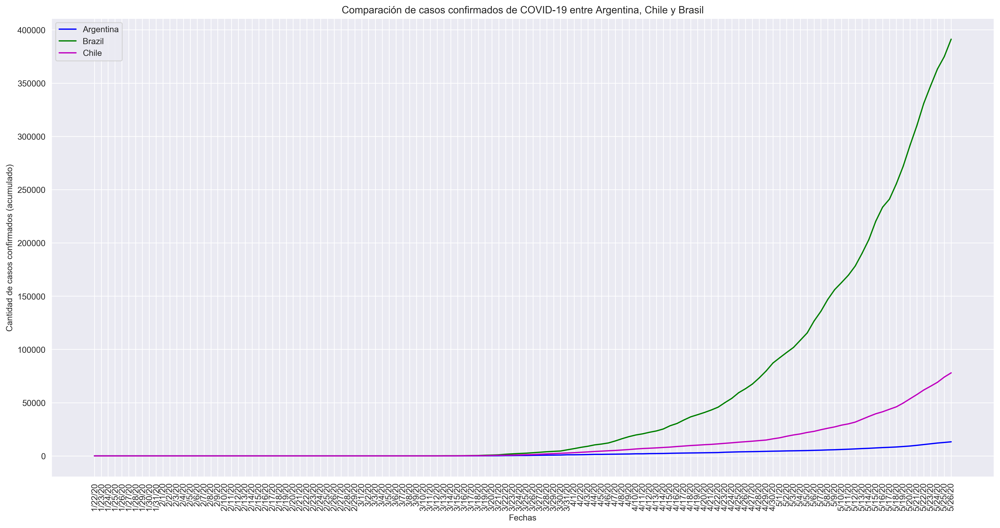

In [1869]:
#Hacemos un gráfico para evidenciar las diferencias del crecimiento de la cantidad de infectados entre Argentina, Chile y Brasil
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_cases.index, argentina_cases.values, label="Argentina", color="b")
plt.plot(brazil_cases.index, brazil_cases.values, label="Brazil", color="g")
plt.plot(chile_cases.index, chile_cases.values, label = "Chile", color="m")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de casos confirmados (acumulado)")
plt.title("Comparación de casos confirmados de COVID-19 entre Argentina, Chile y Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Como vemos, Brasil es el país que tiene más personas contagiadas por COVID-19 hasta la fecha. Lo secunda Chile, y Argentina es el país que presenta menor cantidad de casos. Para ver con mayor precisión los números vamos a ver las columnas correspondientes dentro del dataframe

In [1870]:
confirmed_cases[["Argentina", "Chile", "Brazil"]]

,Argentina,Chile,Brazil
1/22/20,0,0,0
1/23/20,0,0,0
1/24/20,0,0,0
1/25/20,0,0,0
1/26/20,0,0,0
...,...,...,...
5/22/20,10649,61857,330890
5/23/20,11353,65393,347398
5/24/20,12076,69102,363211
5/25/20,12628,73997,374898


#### Así vemos claramente que Brasil tiene la mayor cantidad de habitantes contagiados por covid-19, luego está Chile y por último  Argentina.

#### Ahora bien, para tener una mejor perspectiva de cuánto se esparció el virus en la población de cada país necesitamos saber cuál es la cantidad de habitantes en cada país y calcular la proporción de números de contagios por covid-19 sobre cantidad de población. Es decir, si llamamos  $n_{cont}$ al número de contagios por covid-19 y $n_{hab}$ a la cantidad de habitantes de determinado país, tenemos que calcular: $\frac{n_{cont}}{n_{hab}}$. 

#### Notemos que $\frac{n_{cont}}{n_{hab}}$ es un número que está entre 0 y 1, donde 0 equivale a que ningún habitante se contagió de covid-19 y 1 nos diría que toda la población está infectada.

#### Según el último censo de la Argentina en 2010, el número de habitantes era de 40.117.096 por lo que estimaremos (basandonos en diferentes fuentes) que en el 2020 el número de habitantes es de 45.000.000 (esto sólo es una aproximación, si tuvieramos el dato exacto podríamos ser más precisos). De la misma forma vamos a tomar que la cantidad aproximada de habitantes en Chile es 18.907.117 y en Brasil 217.323.363 


In [1871]:
hab_arg = 45000000
hab_chi = 18907117
hab_bra = 217323363

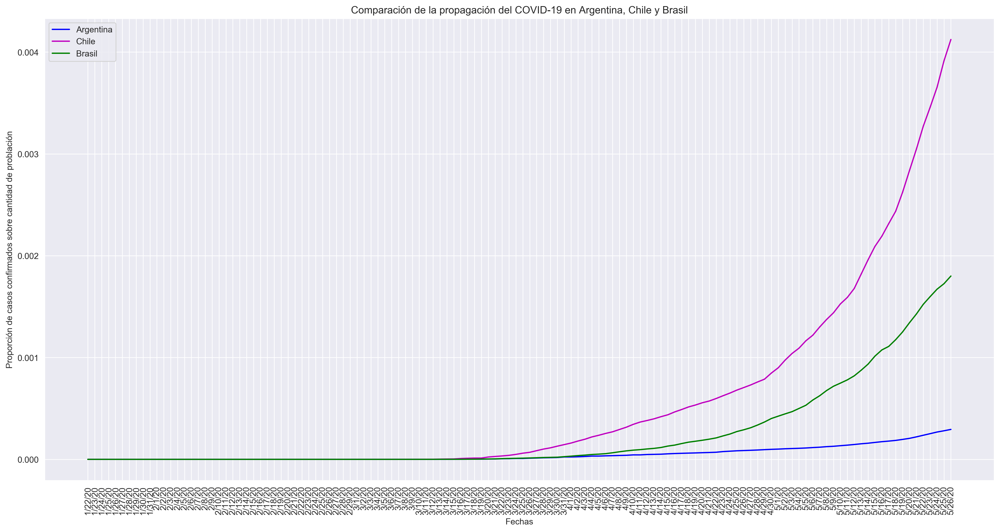

In [1872]:
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_cases.index, argentina_cases.values/hab_arg, label="Argentina", color="b")
plt.plot(chile_cases.index, chile_cases.values/hab_chi, label="Chile", color="m")
plt.plot(brazil_cases.index, brazil_cases.values/hab_bra, label="Brasil", color="g")
plt.xlabel("Fechas")
plt.ylabel("Proporción de casos confirmados sobre cantidad de problación")
plt.title("Comparación de la propagación del COVID-19 en Argentina, Chile y Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Notemos que si bien Brasil tiene la mayor cantidad de contagios registrados hasta la fecha, en este gráfico se ve como Chile ha superado ampliamente a Argentina y Brasil midiendo la cantidad de propagación del virus sobre cantidad de población. Esto nos lleva a preguntarnos: ¿Las políticas que ha tomado Chile sobre la prevención son peores que las de Brasil o Argentina? 

#### Nosotros sabemos que Argentina ha implementado la cuarentena total desde el 17 de Marzo y Brasil ha hecho todo lo contrario. Es decir que tenemos dos escenarios totalmente opuestos ante rigurosidad de prevención y, sabemos además, que Chile también ha implementado un tipo de cuarentena selectiva (no tan restringida como la de la Argentina) a partir del 18 de Marzo. Con esto en mente, uno tiende a pensar cómo puede suceder que un país que no aplicó ninguna medida preventiva tiene menos cantidad de infectados en proporción que uno que si. ¿Habrá otro factor que no estamos teniendo en cuenta que nos ayudaría a comprender mejor estos gráficos? 


#### Claramente, el número de casos confirmados de covid-19 es el resultado de testeos en los habitantes del país. Por lo tanto este gráfico, un poco anómalo, dado lo hablado anteriormente nos llevaría a la siguiente pregunta: ¿Cómo es el sistema de testeos de contagios del covid-19 en Brasil? ¿Realizan menos testeos que Argentina o Chile? 

#### Para contestar estas preguntas nos haría falta saber qué porcentaje de población es testeado por covid-19 en cada país. No tenemos los datos precisos pero si buscamos, distintas fuentes nos dan un dato aproximado al 19 de Mayo: en Argentina se produjo una cantidad de 105829 testeos, en Chile 381011 y en Brasil 735200. Con estos datos vamos a calcular el porcentaje de testeos que se hizo en la población de cada país.



In [1873]:
#Porcentaje de testeos

test_arg = 105829*100/hab_arg
test_chi = 381011*100/hab_chi
test_bra = 735200*100/hab_bra
print(test_arg , test_chi , test_bra)

0.23517555555555555 2.0151723819131178 0.3382977282566716


#### Vemos entonces que, aproximandamente, Argentina testeó al 0,2% de su población, Brasil al 0,3% mientras que Chile testeó al 2% de su población. Ahora tiene sentido que Chile presente la mayor cantidad de contagios por covid19 que Argentina y Brasil sobre población. Con esto pensamos lo siguiente: ¿Habrá muchos casos de contagios en Argentina y Brasil que no se conocen ya que hacen menos testeos?

#### Para tratar de dar respuesta a este interrogante, analicemos ahora la cantidad de muertes por COVID19 que se dieron en cada país. 

# 3 - Casos de muertes por COVID-19 <a id="3"></a>

Cargamos los datos obtenidos sobre la cantidad de muertes producidas por COVID-19 en todos los países del mundo. La cantidad de muertes también está expresada en forma acumulada.


## 3.1 - Cargamos los datos <a id="3.1"></a>

In [1874]:
deaths_cases = pd.read_csv("time_series_covid19_deaths_global.csv")

#Veamos como es el dataframe

deaths_cases

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20
0,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,...,169,173,178,187,193,205,216,218,219,220
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,31,31,31,31,31,31,31,32,32,33
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,548,555,561,568,575,582,592,600,609,617
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,51,51,51,51,51,51,51,51,51,51
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,2,3,3,3,3,3,4,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,...,7,7,8,8,8,8,8,8,11,12
262,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,20,20,28,30,33,33,39,42,44,49
263,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
264,NaN,Tajikistan,38.861034,71.276093,0,0,0,0,0,0,...,39,41,41,41,44,44,44,46,46,47


## 3.2 - Procesamos los datos obtenidos <a id="3.2"></a>

Eliminamos las columnas que no son útiles para este análisis.

In [1875]:
deaths_cases = deaths_cases.drop(["Province/State", "Lat", "Long"], axis=1)

Nuevamente trasponemos el dataframe para mayor comodidad del trabajo de datos

In [1876]:
deaths_cases = deaths_cases.transpose()
deaths_cases

,0,1,2,3,4,5,6,7,8,9,...,256,257,258,259,260,261,262,263,264,265
Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Australia,...,Malawi,United Kingdom,France,South Sudan,Western Sahara,Sao Tome and Principe,Yemen,Comoros,Tajikistan,Lesotho
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5/22/20,205,31,582,51,3,3,433,74,3,48,...,3,0,0,6,0,8,33,1,44,0
5/23/20,216,31,592,51,4,3,445,77,3,48,...,3,0,0,8,0,8,39,1,44,0
5/24/20,218,32,600,51,4,3,452,81,3,48,...,4,0,0,8,0,8,42,1,46,0
5/25/20,219,32,609,51,4,3,467,87,3,48,...,4,0,0,8,0,11,44,1,46,0


In [1877]:
deaths_cases.columns=deaths_cases.loc["Country/Region"].values

In [1878]:
deaths_cases.drop("Country/Region", inplace = True)

Ya procesado nos queda el siguiente dataframe

In [1879]:
deaths_cases

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Australia,...,Malawi,United Kingdom,France,South Sudan,Western Sahara,Sao Tome and Principe,Yemen,Comoros,Tajikistan,Lesotho
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5/22/20,205,31,582,51,3,3,433,74,3,48,...,3,0,0,6,0,8,33,1,44,0
5/23/20,216,31,592,51,4,3,445,77,3,48,...,3,0,0,8,0,8,39,1,44,0
5/24/20,218,32,600,51,4,3,452,81,3,48,...,4,0,0,8,0,8,42,1,46,0
5/25/20,219,32,609,51,4,3,467,87,3,48,...,4,0,0,8,0,11,44,1,46,0


## 3.3 - Analizamos el dataset para Argentina, Chile y Brasil  <a id="3.3"></a>

Tomamos las columnas correspondientes a los casos de muertes en Argentina, Chile y Brasil.

In [1880]:
argentina_deaths_cases=deaths_cases["Argentina"]
brazil_deaths_cases = deaths_cases["Brazil"]
chile_deaths_cases=deaths_cases["Chile"]

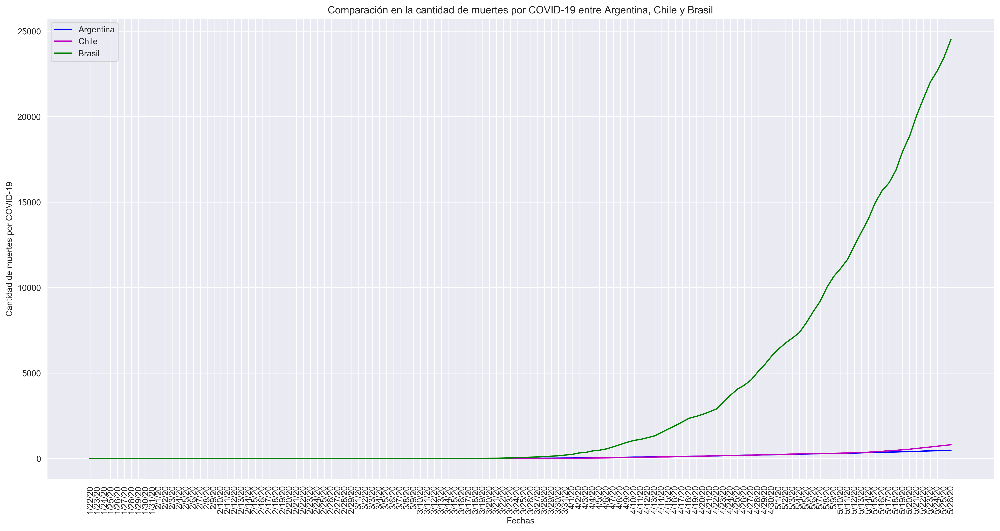

In [1881]:
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_deaths_cases.index, argentina_deaths_cases.values, label="Argentina", color="b")
plt.plot(chile_deaths_cases.index, chile_deaths_cases.values, label="Chile", color="m")
plt.plot(brazil_deaths_cases.index, brazil_deaths_cases.values, label="Brasil", color="g")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por COVID-19")
plt.title("Comparación en la cantidad de muertes por COVID-19 entre Argentina, Chile y Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

Veamos más detalladamente los números finales.

In [1882]:
deaths_cases[["Argentina", "Chile", "Brazil"]]

,Argentina,Chile,Brazil
1/22/20,0,0,0
1/23/20,0,0,0
1/24/20,0,0,0
1/25/20,0,0,0
1/26/20,0,0,0
...,...,...,...
5/22/20,433,630,21048
5/23/20,445,673,22013
5/24/20,452,718,22666
5/25/20,467,761,23473


#### El gráfico nos muestra que Brasil tiene el mayor número de muertes por covid-19. Le sigue Chile y luego Argentina.  

Veamos qué sucede en proporción con la cantidad de población de cada país:

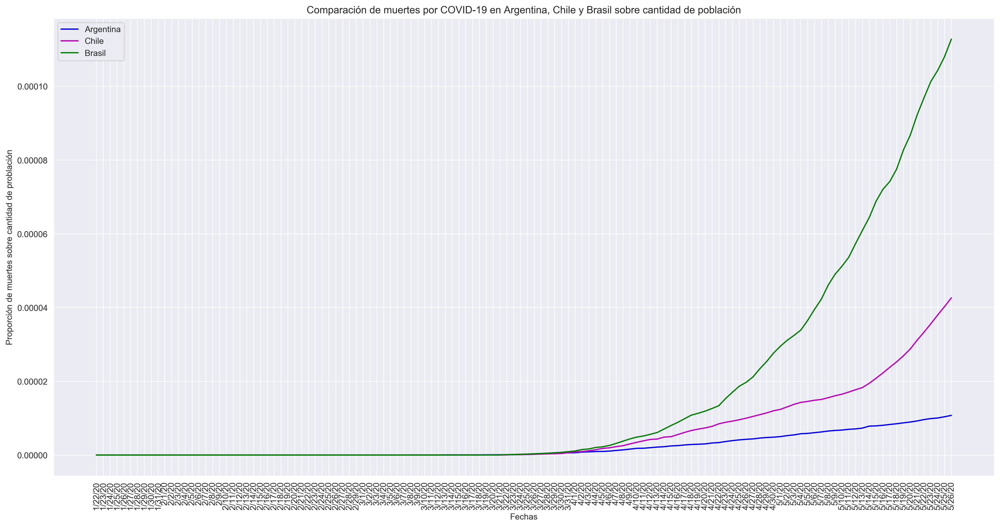

In [1883]:
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_deaths_cases.index, argentina_deaths_cases.values/hab_arg, label="Argentina", color="b")
plt.plot(chile_deaths_cases.index, chile_deaths_cases.values/hab_chi, label="Chile", color="m")
plt.plot(brazil_deaths_cases.index, brazil_deaths_cases.values/hab_bra, label="Brasil", color="g")
plt.xlabel("Fechas")
plt.ylabel("Proporción de muertes sobre cantidad de problación")
plt.title("Comparación de muertes por COVID-19 en Argentina, Chile y Brasil sobre cantidad de población")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### En este último gráfico podemos ver que Brasil tiene la mayor proporción de muertes por covid-19 que Argentina y Chile. 

#### Volviendo a nuestra pregunta "¿Habrá muchos casos de contagios en Argentina y Brasil que no se conocen ya que hacen menos testeos?" tenemos dos casos:

#### Si vemos los datos de Brasil, por la cantidad de muertes por covid-19 que poseen sobre la cantidad de población uno podría suponer que los casos que vemos en los datos corresponden a personas con un cuadro avanzado de covid-19, y podría haber una gran cantidad de habitantes con síntomas leves que no acuden al hospital y, por lo tanto, no están siendo testeados.

#### Viendo el caso de Argentina, el número se mantiene debajo. Esto no parece una anomalía dado que la cantidad de infectados también es menor. 

# 4 - Predicciones  <a id="4"></a>

Con toda la información recolectada, queremos tener una idea de cómo se comporta este virus. 

Tomaremos nuevamente los dataframes confirmed_cases y deaths_cases concentrando nuestro análisis en Argentina, Chile y Brasil para tratar de predecir cuántos nuevos contagios y cuántas nuevas muertes podrían darse de un día para otro.

Para esto, vamos a tomar los datos de cierta cantidad de días y calcular tanto el promedio como el valor medio del número de contagios y fallecimientos por día para poder tener una estimación del número correspondiente al día siguiente. 

Sabemos que nuestro dataframe nos da la cantidad acumulada de estos datos a la fecha y como queremos la cantidad exacta por día entonces vamos a trabajar un poco los dataframes.

### Cantidad de muertos por día por covid19

Creamos una lista con los casos de contagios en Argentina, Chile y Brasil por día y se lo agregamos a nuestro dataframe original deaths_cases.

In [1884]:
arg_deaths_by_day = []
for i in range(len(argentina_deaths_cases)):
    if i==0:
        arg_deaths_by_day.append(argentina_deaths_cases[i])
    else:
        deaths_day=argentina_deaths_cases[i]-argentina_deaths_cases[i-1]
        arg_deaths_by_day.append(deaths_day)
arg_deaths_by_day   

deaths_cases["Argentina_deaths_day"]=arg_deaths_by_day

chi_deaths_by_day = []
for i in range(len(chile_deaths_cases)):
    if i==0:
        chi_deaths_by_day.append(chile_deaths_cases[i])
    else:
        deaths_day=chile_deaths_cases[i]-chile_deaths_cases[i-1]
        chi_deaths_by_day.append(deaths_day)
chi_deaths_by_day   

deaths_cases["Chile_deaths_day"]=chi_deaths_by_day

bra_deaths_by_day = []
for i in range(len(brazil_deaths_cases)):
    if i==0:
        bra_deaths_by_day.append(brazil_deaths_cases[i])
    else:
        deaths_day=brazil_deaths_cases[i]-brazil_deaths_cases[i-1]
        bra_deaths_by_day.append(deaths_day)
bra_deaths_by_day   

deaths_cases["Brazil_deaths_day"]=bra_deaths_by_day

Tomamos sólo la información de las columnas que nos interesan.

In [1885]:
south_deaths= ["Argentina", "Chile", "Brazil", "Argentina_deaths_day", "Chile_deaths_day", "Brazil_deaths_day"]
deaths_south = deaths_cases[([j for j in south_deaths])]
deaths_south

,Argentina,Chile,Brazil,Argentina_deaths_day,Chile_deaths_day,Brazil_deaths_day
1/22/20,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0
...,...,...,...,...,...,...
5/22/20,433,630,21048,17,41,1001
5/23/20,445,673,22013,12,43,965
5/24/20,452,718,22666,7,45,653
5/25/20,467,761,23473,15,43,807


Vamos a graficar estos datos para ver como se comportan.

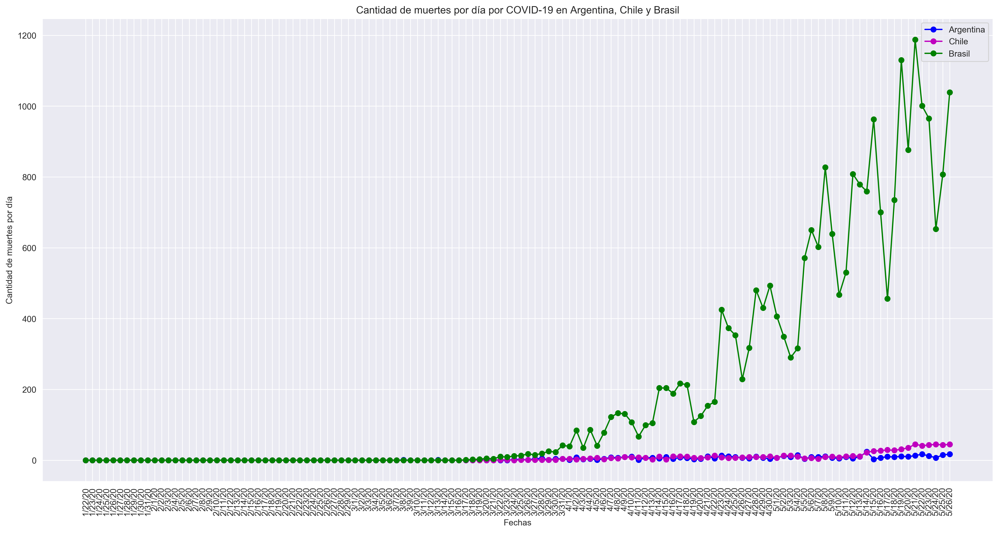

In [1886]:
#Graficos de cantidad de muertes por día

plt.figure(figsize= (20,10), dpi=300)
plt.plot(argentina_deaths_cases.index, deaths_south["Argentina_deaths_day"] , "-o", label = "Argentina" , c="b")
plt.plot(chile_deaths_cases.index, deaths_south["Chile_deaths_day"] , "-o" , label = "Chile", c="m")
plt.plot(brazil_deaths_cases.index, deaths_south["Brazil_deaths_day"] , "-o" ,label = "Brasil", c="g")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Cantidad de muertes por día por COVID-19 en Argentina, Chile y Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### En el gráfico notamos que como Brasil tiene una gran cantidad de muertos por día, los números de Argentina y Chile no se distinguen, por lo que es conveniente realizar un gráfico separado por cada país.

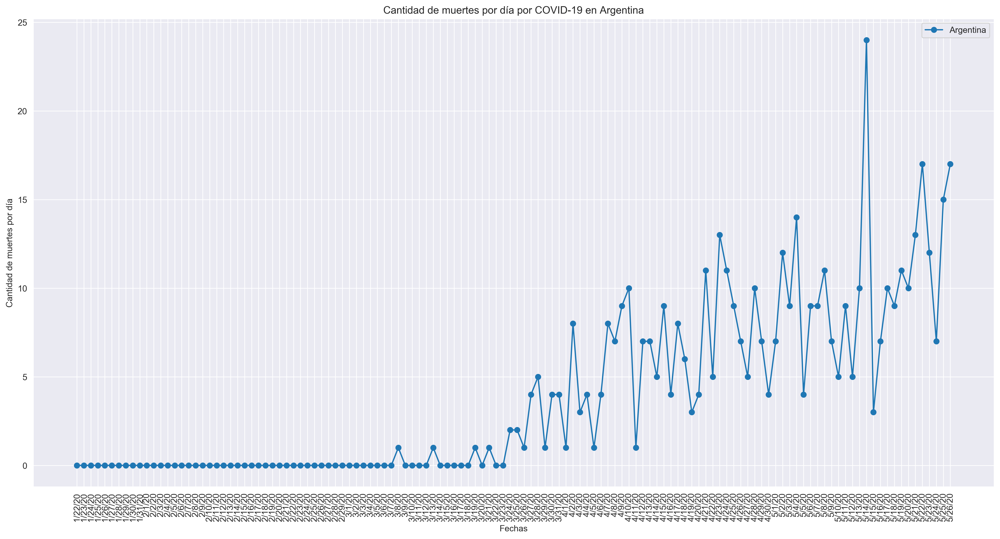

In [1887]:
#Gráfico de muertes por día en Argentina

plt.figure(figsize= (20,10), dpi=300)
plt.plot(argentina_deaths_cases.index, deaths_south["Argentina_deaths_day"] , "-o", label = "Argentina")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Cantidad de muertes por día por COVID-19 en Argentina")
plt.xticks(rotation=90)
plt.legend()
plt.show()

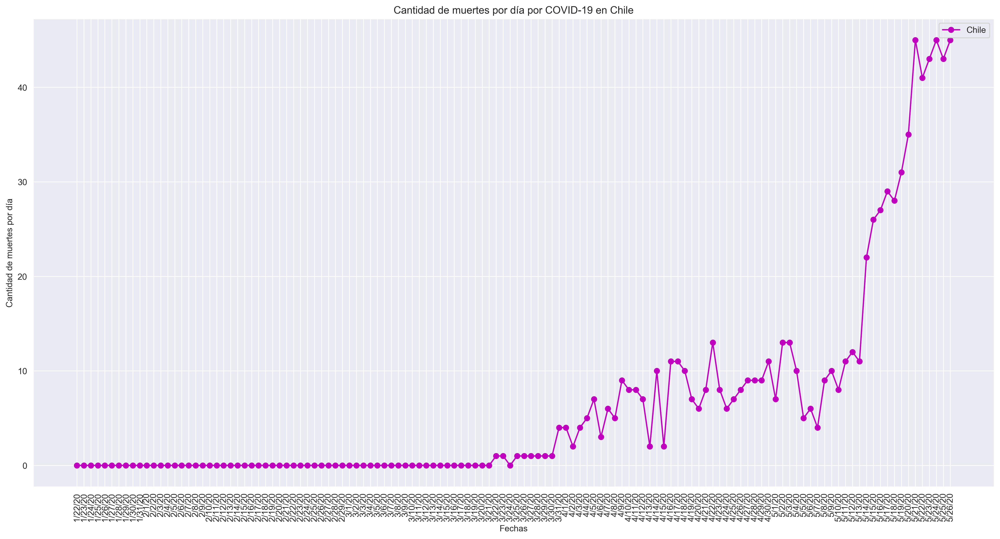

In [1888]:
#Gráfico de muertes por día en Chile

plt.figure(figsize= (20,10), dpi=300)
plt.plot(chile_deaths_cases.index, deaths_south["Chile_deaths_day"] , "-o", label = "Chile", c="m")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Cantidad de muertes por día por COVID-19 en Chile")
plt.xticks(rotation=90)
plt.legend()
plt.show()

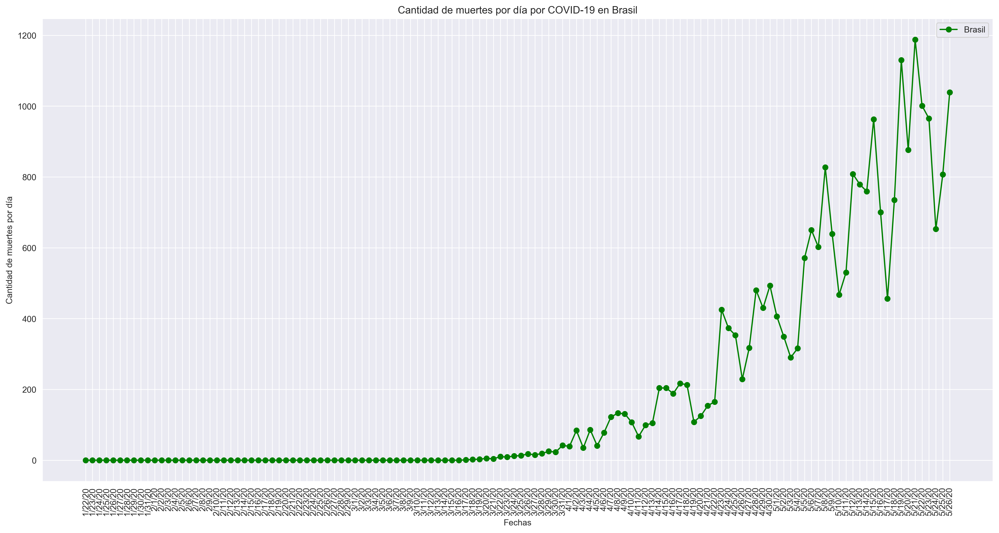

In [1889]:
#Gráfico de muertes por día en Brasil

plt.figure(figsize= (20,10), dpi=300)
plt.plot(brazil_deaths_cases.index, deaths_south["Brazil_deaths_day"] , "-o", label = "Brasil", c="g")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Cantidad de muertes por día por COVID-19 en Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

## 4.1 - Predicción de muertes por COVID-19 <a id="4.1"></a>

Como dije antes, lo que vamos a calcular es el promedio y el valor medio de muertes por día en cada lugar. Para hacer esto, lo que tenemos que calcular es la media y la mediana del número de muertes por día en cada país.

Voy a tomar a uno de los países como ejemplo para realizar los cálculos. Tomemos a Argentina. 

Vamos a considerar un intervalo de 7 días para analizar. Por ejemplo la semana del 4 al 10 de mayo.

In [1890]:
deaths_south["Argentina_deaths_day"].iloc[103 : 110]

5/4/20     14
5/5/20      4
5/6/20      9
5/7/20      9
5/8/20     11
5/9/20      7
5/10/20     5
Name: Argentina_deaths_day, dtype: int64

Calculamos la media de esa semana (es decir, el valor promedio).

In [1891]:
#Calculamos la media
np.mean(deaths_south["Argentina_deaths_day"].iloc[103 : 110])

#Calculamos la desviación estándar de los datos
np.std(deaths_south["Argentina_deaths_day"].iloc[103:110])

print(np.mean(deaths_south["Argentina_deaths_day"].iloc[103 : 110]))
print(np.std(deaths_south["Argentina_deaths_day"].iloc[103 : 110]))


8.428571428571429
3.2007652146297256


Como estamos hablando de cantidad de personas necesitamos que los números sean enteros.

In [1892]:
print(int(np.mean(deaths_south["Argentina_deaths_day"].iloc[103 : 110])))
print(int(np.std(deaths_south["Argentina_deaths_day"].iloc[103 : 110])))

8
3


#### Si suponemos que la cantidad de muertos por covid-19 el día 11 de mayo está dada por la media de toda la semana anterior entonces tendríamos que habrá alrededor de 8 muertos el 11/5 con un error de cálculo de +-3 fallecidos que nos da la desviación estándar. 

Veamos cuál fue el número de muertos el 11 de mayo.

In [1893]:
deaths_south["Argentina_deaths_day"].iloc[110 : 111]

5/11/20    9
Name: Argentina_deaths_day, dtype: int64

#### Como vemos, el número de muertes fue de 9 personas por lo que nuestra aproximación fue bastante buena. 

#### Veamos otro ejemplo: viendo el gráfico de muertes en Argentina, podemos notar que hubo un pico de muertes. Este pico fue de 24 personas y se produjo el día 14 de mayo. Sería interesante ver si nuestra aproximación es buena tomando una semana que incluya a este pico.

Consideramos la semana del 9 al 15 de mayo.

In [1894]:
deaths_south["Argentina_deaths_day"].iloc[108 :115]

5/9/20      7
5/10/20     5
5/11/20     9
5/12/20     5
5/13/20    10
5/14/20    24
5/15/20     3
Name: Argentina_deaths_day, dtype: int64

In [1895]:
#Calculamos la media y el desvío estándar

np.mean(deaths_south["Argentina_deaths_day"].iloc[108 : 115])
np.std(deaths_south["Argentina_deaths_day"].iloc[108:115])

print(int(np.mean(deaths_south["Argentina_deaths_day"].iloc[108 : 115])))
print(int(np.std(deaths_south["Argentina_deaths_day"].iloc[108 : 115])))

9
6


Veamos qué cantidad de muertes se dieron el 16 de mayo

In [1896]:
deaths_south["Argentina_deaths_day"].iloc[115 : 116]

5/16/20    7
Name: Argentina_deaths_day, dtype: int64

#### El número de muertes se aproxima bastante a lo que nos dio el cálculo de la media, sin embargo la aproximación de muertes es de 9 personas con un error de +-6 fallecidos, lo cual no es una buena predicción dado que nos queda un intervalo muy grande para la predicción de muertes. 

#### Notemos que este intervalo tan amplio es por la influencia del pico de 24 muertes dentro de la semana cuando hasta el momento sólo se habían visto números menores o iguales a 10. Por esta razón vamos a mejorar nuestra aproximación calculando el valor intermedio de todos los datos de la semana, la mediana, ya que este número no se ve afectado por un pico en las muertes.


Calculamos la mediana de la semana del 9 al 15 de mayo.

In [1897]:
#Calculamos la mediana
np.median(deaths_south["Argentina_deaths_day"].iloc[108 : 115])

print(int(np.median(deaths_south["Argentina_deaths_day"].iloc[108 : 115])))

7


Veamos cual es la desviación absoluta de la mediana, la llamamos $mad$ y la definimos como sigue: 
$$mad = median ( | x - median(x) | ).$$

Vamos a definir la función $mad$ para usarla en nuestro análisis.

In [1898]:
#Creamos la función mad
def mad(a):
    return int(np.median(np.abs(a.values -np.median(a))))

Aplicamos mad en la semana del 9 al 15 de mayo.

In [1899]:
mad(deaths_south["Argentina_deaths_day"].iloc[108 : 115])

2

#### Con el cálculo de la mediana nuestra predicción nos devolvió el número exacto y con un intervalo de confianza de +-2 fallecidos. Podemos concluir que para este tipo de casos donde tenemos picos de datos, nuestra predicción con la mediana será una buena aproximación al resultado real. 

#### Con esto en mente vamos a definir una función que tome una semana aleatoria y nos devuelva la predicción para el día siguiente al que termina esa semana


#### La siguiente función toma una semana a partir de cierto día que nos interese desde que comenzó el primer caso. Definiremos la función $week$ que para un día dado nos dará ese día y los 6 anteriores para poder tener la semana a analizar. 

In [1900]:
def week(dia_seleccionado):
    indice_comienzo = dia_seleccionado - 7
    indice_fin = dia_seleccionado
    if (indice_comienzo >= len(deaths_south["Argentina_deaths_day"]) or indice_comienzo < 0):
        return print("No hay más semanas")
    elif indice_fin > len(deaths_south["Argentina_deaths_day"]):
        return deaths_south["Argentina_deaths_day"].iloc[indice_comienzo : len(deaths_south["Argentina_deaths_day"])]
    else:
        return deaths_south["Argentina_deaths_day"].iloc[indice_comienzo : indice_fin]

Ahora bien ¿Cómo funciona $week$? Como sabemos que el primer caso de covid-19 se dió el 22 de enero del 2020, este correspondería a evaluar la función en 7, ya que nos devolvería la primer semana desde que comenzó el virus.


In [1901]:
week(7)

1/22/20    0
1/23/20    0
1/24/20    0
1/25/20    0
1/26/20    0
1/27/20    0
1/28/20    0
Name: Argentina_deaths_day, dtype: int64

Otro ejemplo: si nos interesara saber la cantidad de muertes en la semana que finaliza el 14 de abril tendríamos que poner el número de día que le corresponde. En este caso sería el día 84 contando desde el 22 de enero.


In [1902]:
week(84)

4/8/20      7
4/9/20      9
4/10/20    10
4/11/20     1
4/12/20     7
4/13/20     7
4/14/20     5
Name: Argentina_deaths_day, dtype: int64

#### Ahora bien, ya teniendo una función para seleccionar una semana aleatoria, en lo que sigue vamos a definir una función que nos calcule la predicción deseada del día siguiente al seleccionado usando la mediana de los datos.

In [1903]:
def deaths_next_day(n):
    print(f"El número de fallecidos será de {int(np.median(week(n)))} personas con un error de +-{mad(week(n))} fallecidos")

Siguiendo con el ejemplo anterior. Si nosotros queremos saber cuál será la predicción de muertes para el día 15 de abril, sabemos que le corresponde el día número 85 por lo tanto evaluamos en deaths_next_day

In [1904]:
deaths_next_day(84)

El número de fallecidos será de 7 personas con un error de +-2 fallecidos


#### Es decir que nos da una predicción de 7 muertes por covid-19 con un error de +-2 muertes para el 15 de abril. Si vamos a los datos podemos ver el 15 de abril se declararon 9 fallecimientos, lo cual está dentro del intervalo de confianza de nuestra predicción.

Como parece que nuestra predicción es bastante confiable, vamos a calcular todas las muertes bajo nuestra función predictiva y compararla con los datos reales.

In [1974]:
#Aplicamos la función predictiva a los datos de cada día para predecir el siguiente

def deaths_next_day_median(i):
    return int(np.median(week(i)))

prediccion_week=[]
for i in range(len(deaths_south["Argentina_deaths_day"])):
    if i<7:
        prediccion_week.append(0)
    else:
        aprox= deaths_next_day_median(i)
        prediccion_week.append(aprox)
        

Vamos a hacer lo mismo con la media para notar la diferencia con la aproximación dada con la mediana y cerciorarnos que nuestras conclusiones anteriores son correctas.

In [1975]:
#Definimos una función predictiva usando la media

def deaths_next_day_mean(j):
    return int(np.mean(week(j)))
    
#Aplicamos esta función predictiva a los datos para obtener mi aproximación

prediccion_week_mean=[]
for i in range(len(deaths_south["Argentina_deaths_day"])):
    if i<7:
        prediccion_week_mean.append(0)
    else:
        aprox= deaths_next_day_mean(i)
        prediccion_week_mean.append(aprox)
    

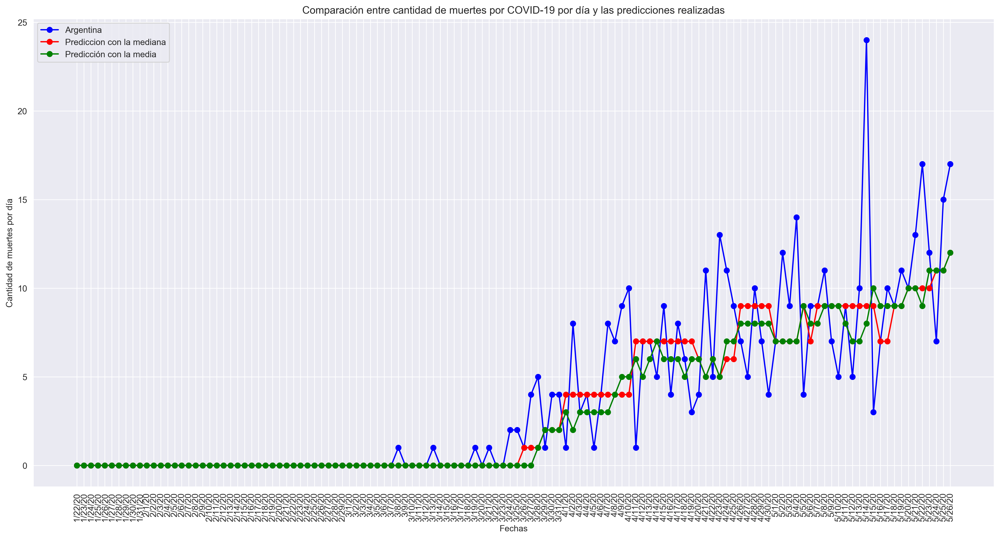

In [1976]:
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_deaths_cases.index, deaths_south["Argentina_deaths_day"] , "-o", label = "Argentina", color="b")
plt.plot(argentina_deaths_cases.index, prediccion_week , "-o", label = "Prediccion con la mediana", color ="r")
plt.plot(argentina_deaths_cases.index, prediccion_week_mean, "-o", label="Predicción con la media", color="g")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Comparación entre cantidad de muertes por COVID-19 por día y las predicciones realizadas")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### En el gráfico podemos observar que efectivamente las predicciones realizadas usando la mediana son más certeras que las predicciones usando la media.

#### Otra cosa que podemos ver es que muestra muchas mesetas en las aproximaciones cuando consideramos los datos de una semana. Esto nos lleva a preguntarnos ¿Qué pasaría si variamos la cantidad de días que tomamos para el análisis de los datos? Si tenemos una variable de cantidad de días llamada $m$, cuál es el $m$ óptimo para que las predicciones se acerquen lo más posible a los datos reales? 

Para responder estas cuestiones vamos a definir una función donde podamos manipular la cantidad de días a analizar para nuestra predicción. La llamaremos $date$.

In [1908]:
def date(selected_day, m):
    indice_comienzo = selected_day - m
    indice_fin = selected_day 
    if indice_comienzo >= len(deaths_south["Argentina_deaths_day"]):
        return print("No quedan más días")
    elif indice_fin > len(deaths_south["Argentina_deaths_day"]):
        return deaths_south["Argentina_deaths_day"].iloc[indice_comienzo : len(deaths_south["Argentina_deaths_day"])]
    else:
        return deaths_south["Argentina_deaths_day"].iloc[indice_comienzo : indice_fin]

La función $date$ tiene dos variables, la primera es el día a seleccionar y se comporta al igual que la función $week$ sólo que ahora, en la segunda variable, podemos elegir la cantidad de días que queremos tener en cuenta para nuestro análisis. 

Por ejemplo, si queremos que nos devuelva el día 14 de abril y cuatro días antes de el.

In [1909]:
date(84,5)

4/10/20    10
4/11/20     1
4/12/20     7
4/13/20     7
4/14/20     5
Name: Argentina_deaths_day, dtype: int64

En base a la función date, definiremos nuestra función predictiva como hicimos anteriormente.

In [1910]:
def date_deaths_next_day(selected_day,m):
    print(f"El número de fallecidos será de {int(np.median(date(selected_day,m)))} con un error de +-{mad(date(selected_day,m))} fallecidos")

Así, por ejemplo, si queremos predecir la cantidad de muertes el 15 de abril analizando 5 días de mi dataframe:

In [1911]:
date_deaths_next_day(84,5)

El número de fallecidos será de 7 con un error de +-2 fallecidos


Definimos la función de predicción con la mediana usando la función date.

In [1912]:
def prediction_next_day(i,m):
    return int(np.median(date(i,m)))

#Definimos también la función que nos da la desviación absoluta de la mediana para luego tener nuestro intervalo de confianza

def interval_next_day(i,m):
    return mad(date(i,m))

Definimos una función de predicción que sólo dependerá de la cantidad de días a analizar y nos devolverá la lista de predicciones dependiendo la cantidad de días elegidos.

In [1913]:
def date_prediction(m):
    prediction=[]
    for i in range(len(deaths_cases["Argentina_deaths_day"])):
        if i < m:
            prediction.append(0)
        else:
            pred = prediction_next_day(i , m)
            prediction.append(pred)
    return prediction

In [1914]:
#Hacemos lo mismo para la desviación absoluta

def interval_prediction(m):
    int_prediction=[]
    for i in range(len(deaths_cases["Argentina_deaths_day"])):
        if i < m:
            int_prediction.append(0)
        else:
            int_pred = interval_next_day(i , m)
            int_prediction.append(int_pred)
    return int_prediction

Esta función nos da la predicción realizada al analizar $m$ días. Por ejemplo, si $m=7$ tenemos

In [1915]:
print(date_prediction(7))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 5, 6, 5, 6, 6, 9, 9, 9, 9, 9, 7, 7, 7, 7, 9, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 7, 9, 9, 10, 10, 10, 10, 11, 11, 12]


#### Con el fin de encontrar el óptimo m tal que la predicción sea más precisa vamos a tomar el promedio de la diferencia entre los puntos.

In [1916]:
#Calculamos la diferencia en valor absoluto
def dif_mean(y_dat , y_pred):
    return np.mean(np.abs(y_dat - y_pred))

#### Detengamonos un momento acá. Con todo lo analizado anteriormente basta utilizar la función dif_mean para saber cúal es el $m$ que mejor aproxima la predicción a los datos reales. Como vemos dif_mean es una función de dos variables, en la primera ponemos los datos reales sobre los casos de muertes por día mientras que en la segunda ponemos la predicción realizada. 

#### Una primer idea para encontrar a este $m$ podría ser evaluar en la primer variable los datos deaths_cases["Argentina_deaths_day"] y en la segunda la predicción sobre todos estos días. El problema con esta idea es que es muy factible caer en un sobreajuste de los datos ya que el modelo estaría ajustando sobre la totalidad de los datos. Por este motivo, vamos a encontrar el óptimo $m$ para un porcentaje de los días transcurridos y luego ver como se amolda a los días siguientes.   

#### Recordemos que, hasta ahora, hemos consideramos como ejemplo a Argentina. Vamos a realizar este paso con los distintos países para encontrar la mejor aproximación y observar si varía $m$.

### 4.1.1 - Argentina <a id="4.1.1"></a>

Vamos a analizar los datos de muertes por COVID-19 en Argentina hasta el 30 de abril. Variaremos $m$ de 3 a 10 días.

In [1917]:
#El 30 de abril corresponde al día 100 desde el primer caso de covid-19

for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(deaths_cases["Argentina_deaths_day"].iloc[0: 100], date_prediction(m)[0:100]))

1.01
1.05
1.04
1.08
1.07
1.03
1.09
1.09


#### El menor número que nos da la diferencia calculada entre los datos y la aproximación es el primero. Así, vemos que el número óptimo a considerar es $m=3$. 

#### Vamos a ver el gráfico que nos quedaría fijando este número.

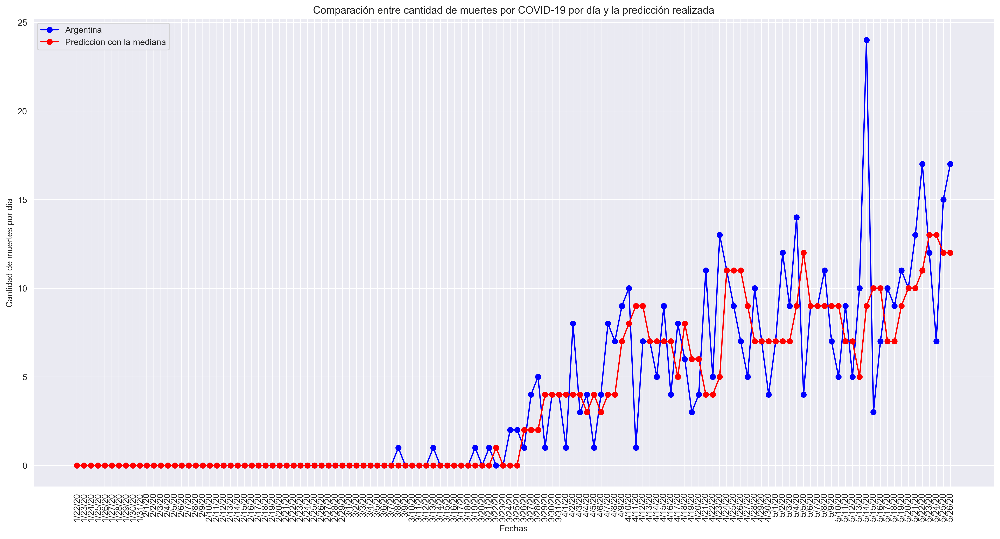

In [1918]:
#Gráfico con una predicción basada en el análisis de 3 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_deaths_cases.index, deaths_south["Argentina_deaths_day"] , "-o", label = "Argentina", color="b")
plt.plot(argentina_deaths_cases.index, date_prediction(3) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Comparación entre cantidad de muertes por COVID-19 por día y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Puede verse que si bien la predicción no coincide siempre, se mantienen dentro del intervalo de confianza de nuestra predicción y tenemos una tendencia marcada de como fluctúan los datos. Podríamos pensar qué sucede con la cantidad de muertes en forma acumulada de la aproximación y compararla con los datos reales. 

In [1919]:
#Número de muertes acumuladas según la aproximación y la desviación que nos da el intervalo de confianza
print(f"La cantidad acumulada predicha de muertes es de {sum(date_prediction(3))} con un error de +-{sum(interval_prediction(3))} fallecidos" )

La cantidad acumulada predicha de muertes es de 450 con un error de +-108 fallecidos


In [1920]:
#Veamos el número real
deaths_south.tail(2)

,Argentina,Chile,Brazil,Argentina_deaths_day,Chile_deaths_day,Brazil_deaths_day
5/25/20,467,761,23473,15,43,807
5/26/20,484,806,24512,17,45,1039


#### Viendo el número real podemos decir que tenemos una buena aproximación en forma acumulada. 

Veamos qué hubiera ocurrido si tomabamos la totalidad de los casos para encontrar el $m$ adecuado. 

In [1921]:
#Si calculamos sobre todos los datos veamos cual es la mejor cantidad de días a considerar variando entre 3 y 10.
for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(deaths_cases["Argentina_deaths_day"], date_prediction(m)))

1.5396825396825398
1.5396825396825398
1.5317460317460319
1.5396825396825398
1.5238095238095237
1.5317460317460319
1.5714285714285714
1.5873015873015872


Vemos que el número óptimo a considerar son 8 días. Vamos a ver como quedaría nuestro gráfico.

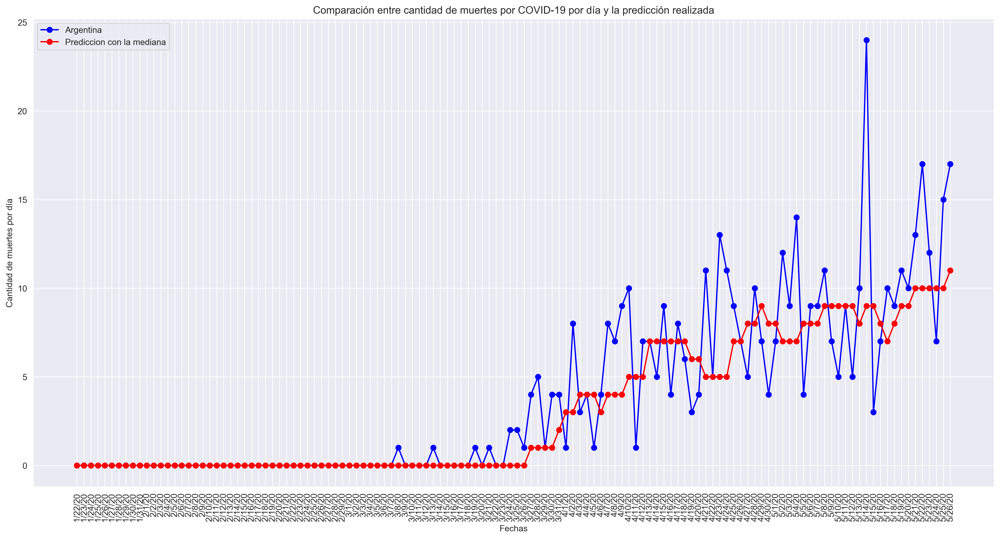

In [1922]:
#Gráfico con una predicción basada en el análisis de 8 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_deaths_cases.index, deaths_south["Argentina_deaths_day"] , "-o", label = "Argentina", color="b")
plt.plot(argentina_deaths_cases.index, date_prediction(8) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Comparación entre cantidad de muertes por COVID-19 por día y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

Podemos ver que en general la aproximación no es mejor que la anterior. Las predicciones se estancan en mesetas y no sigue la fluctuación de los datos reales.

Para terminar de convencernos, veamos el acumulado de muertes de la predicción analizando 8 días.

In [1923]:
print(f"La cantidad acumulada predicha de muertes es de {sum(date_prediction(8))} con un error de {sum(interval_prediction(8))} fallecidos" )

La cantidad acumulada predicha de muertes es de 401 con un error de 108 fallecidos


Como dije antes, estas mesetas que muestran los datos predichos es lo que hace que se esten contando muchas menos muertes de las que en realidad hay. 

Por lo tanto, concluimos que para Argentina tenemos la siguiente función de predicción de muertes de un día para el siguiente.

In [1924]:
#Ya teniendo m=3 tenemos que nuestra mejor función de predicción está dada por:

def tomorrow_arg(selected_day):
    return date_deaths_next_day(selected_day, 3)

### 4.1.2 - Chile <a id="4.1.2"></a>

Ya analizado el caso para Argentina, vamos a seguir los mismos pasos con Chile para encontrar la mejor función predictiva.

Definimos primero la función date_chi que depende de dos variables: el día a elegir y la cantidad de días a analizar.

In [1925]:
def date_chi(selected_day, m):
    indice_comienzo = selected_day - m
    indice_fin = selected_day 
    if indice_comienzo >= len(deaths_south["Chile_deaths_day"]):
        return print("No quedan más días")
    elif indice_fin > len(deaths_south["Chile_deaths_day"]):
        return deaths_south["Chile_deaths_day"].iloc[indice_comienzo : len(deaths_south["Chile_deaths_day"])]
    else:
        return deaths_south["Chile_deaths_day"].iloc[indice_comienzo : indice_fin]

Definimos la función predictiva

In [1926]:
def chile_deaths_next_day(selected_day,m):
    print(f"El número de fallecidos será de {int(np.median(date_chi(selected_day,m)))} con un error de +-{mad(date_chi(selected_day,m))} fallecidos")

Definimos la función de predicción para armar la lista con todas las predicciones de muertes en Chile hasta la fecha.

In [1927]:
def chi_prediction_next_day(i,m):
    return int(np.median(date_chi(i,m)))

#Definimos la función que nos da la desviación absoluta de la mediana

def chi_interval_next_day(i,m):
    return mad(date_chi(i,m))

Definimos la función que sólo dependerá de la cantidad de días a analizar y nos devolverá la lista de predicciones dependiendo la cantidad de días elegidos.

In [1928]:
def chi_date_prediction(m):
    chi_prediction=[]
    for i in range(len(deaths_cases["Chile_deaths_day"])):
        if i < m:
            chi_prediction.append(0)
        else:
            chi_pred = chi_prediction_next_day(i , m)
            chi_prediction.append(chi_pred)
    return chi_prediction

#Hacemos lo mismo para la desviación absoluta de la mediana

def chi_interval_prediction(m):
    chi_int_prediction=[]
    for i in range(len(deaths_cases["Chile_deaths_day"])):
        if i < m:
            chi_int_prediction.append(0)
        else:
            chi_int_pred = chi_interval_next_day(i , m)
            chi_int_prediction.append(chi_int_pred)
    return chi_int_prediction

Con todo definido al igual que antes pero para Chile, vamos a calcular cuál es el óptimo $m$ a considerar. 

Nuevamente, no evaluamos todo el dataset, si no sólo una parte. Vamos a considerar nuevamente nuestro cálculo hasta el 30 de abril.

In [1929]:
#El 30 de abril corresponde al día 100 desde el primer caso de covid-19

for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(deaths_cases["Chile_deaths_day"].iloc[0: 100], chi_date_prediction(m)[0:100]))

0.75
0.77
0.72
0.77
0.81
0.83
0.82
0.89


#### En el caso de Chile, nos dice que el $m$ a considerar será $m=5$. 

Veamos el gráfico correspondiente.

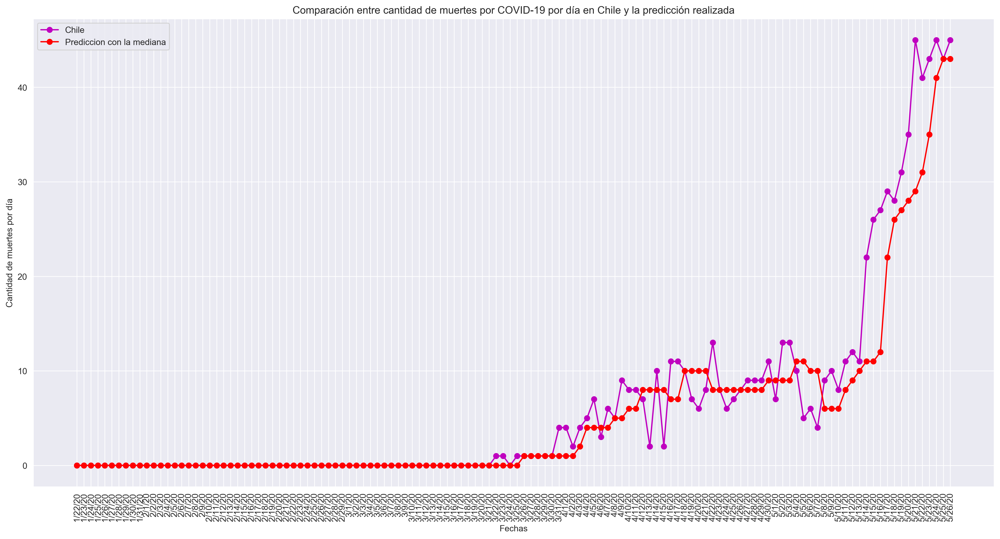

In [1930]:
#Gráfico con una predicción basada en el análisis de 5 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(chile_deaths_cases.index, deaths_south["Chile_deaths_day"] , "-o", label = "Chile", color="m")
plt.plot(chile_deaths_cases.index, chi_date_prediction(5) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Comparación entre cantidad de muertes por COVID-19 por día en Chile y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Vemos que el los datos predichos mantienen la tendencia de los reales, por lo que parece una buena aproximación.

Definimos la función predictiva fijando el número de días a analizar.

In [1931]:
#Número de muertes acumuladas según la aproximación y la desviación que nos da el intervalo de confianza
print(f"La cantidad acumulada predicha de muertes es de {sum(chi_date_prediction(5))} con un error de +-{sum(chi_interval_prediction(5))} fallecidos" )

La cantidad acumulada predicha de muertes es de 680 con un error de +-88 fallecidos


In [1932]:
deaths_south.tail(2)

,Argentina,Chile,Brazil,Argentina_deaths_day,Chile_deaths_day,Brazil_deaths_day
5/25/20,467,761,23473,15,43,807
5/26/20,484,806,24512,17,45,1039


#### Vemos que el número real de muertes acumuladas en Chile no se encuentra dentro de nuestro intervalo de confianza de la predicción. Sin embargo cuando calculamos el $m$ óptimo con la función dif_mean nos daba un número menor que 1 en las diferencias con los datos reales y las aproximaciones. 

#### Una de las cosas que puede estar sucediendo es que hasta fines de abril los casos de muerte en Chile se mantuvieron en cierto ritmo constante. Fluctuaban pero de la misma forma y recién a principios de mayo se empezó a notar que incrementó notablemente y hubo varios picos, de hecho aún sigue creciendo. Por este motivo, los datos aproximados finales no se modelan bien con los reales ya que se entrenó con una serie de datos que mantenían cierta recursividad. 


Finalmente definimos nuestra función predictiva con el número de días fijo en 5.

In [1933]:
def tomorrow_chi(selected_day):
    return chile_deaths_next_day(selected_day, 5)

### 4.1.3 - Brasil <a id="4.1.3"></a>

Analizamos de la misma forma a Brasil.

Definimos la función date_bra.

In [1934]:
def date_bra(selected_day, m):
    indice_comienzo = selected_day - m
    indice_fin = selected_day 
    if indice_comienzo >= len(deaths_south["Brazil_deaths_day"]):
        return print("No quedan más días")
    elif indice_fin > len(deaths_south["Brazil_deaths_day"]):
        return deaths_south["Brazil_deaths_day"].iloc[indice_comienzo : len(deaths_south["Brazil_deaths_day"])]
    else:
        return deaths_south["Brazil_deaths_day"].iloc[indice_comienzo : indice_fin]

Definimos la función predictiva usante date_bra.

In [1935]:
def brazil_deaths_next_day(selected_day,m):
    print(f"El número de fallecidos será de {int(np.median(date_bra(selected_day,m)))} con un error de +-{mad(date_bra(selected_day,m))} fallecidos")

Definimos la función de predicción y la desviación de la mediana.

In [1936]:
def bra_prediction_next_day(i,m):
    return int(np.median(date_bra(i,m)))

#Definimos la función que nos da la desviación de la mediana para luego tener el intervalo de confianza

def bra_interval_next_day(i,m):
    return mad(date_bra(i,m))

Definimos la función que sólo dependerá de la cantidad de días a analizar y nos devolverá la lista de predicciones.

In [1937]:
def bra_date_prediction(m):
    bra_prediction=[]
    for i in range(len(deaths_cases["Brazil_deaths_day"])):
        if i < m:
            bra_prediction.append(0)
        else:
            bra_pred = bra_prediction_next_day(i , m)
            bra_prediction.append(bra_pred)
    return bra_prediction

#Hacemos lo mismo para el intervalo de confianza

def bra_interval_prediction(m):
    bra_int_prediction=[]
    for i in range(len(deaths_cases["Brazil_deaths_day"])):
        if i < m:
            bra_int_prediction.append(0)
        else:
            bra_int_pred = bra_interval_next_day(i , m)
            bra_int_prediction.append(bra_int_pred)
    return bra_int_prediction

Vamos a calcular cuál es el óptimo $m$ a considerar. 

No evaluamos todo el dataset. Vamos a considerar nuevamente nuestro cálculo hasta el 30 de abril.

In [1938]:
#El 30 de abril corresponde al día 100 desde el primer caso de covid-19

for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(deaths_cases["Brazil_deaths_day"].iloc[0: 100], bra_date_prediction(m)[0:100]))

19.92
20.9
22.14
21.71
23.69
24.3
24.58
24.87


#### Tenemos que para $m=3$ tenemos la menor diferencia entre nuestra aproximación y los datos reales.

Graficamos

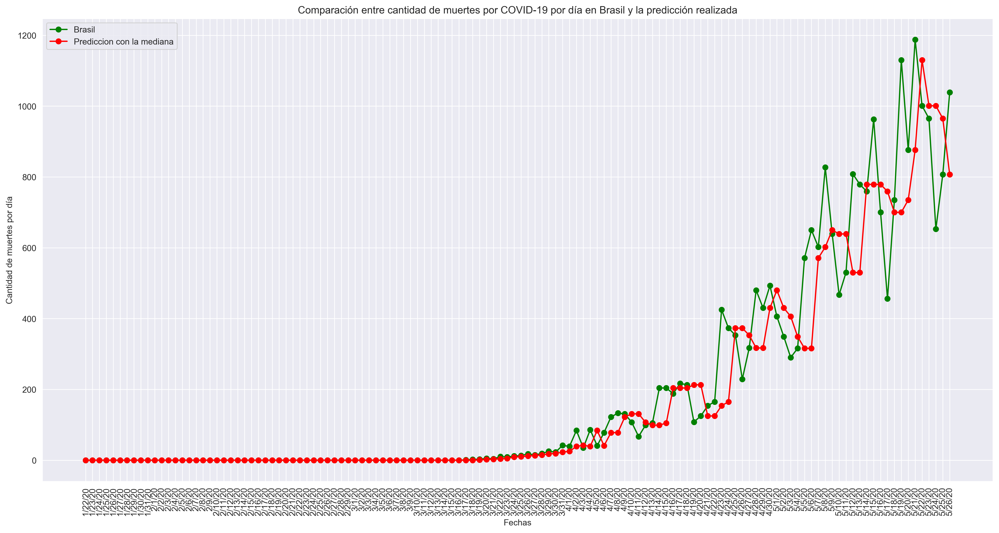

In [1939]:
#Gráfico con una predicción basada en el análisis de 3 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(brazil_deaths_cases.index, deaths_south["Brazil_deaths_day"] , "-o", label = "Brasil", color="g")
plt.plot(brazil_deaths_cases.index, bra_date_prediction(3) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de muertes por día")
plt.title("Comparación entre cantidad de muertes por COVID-19 por día en Brasil y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Puede verse que nuevamente que la predicción se mantiene cerca de los datos reales y sigue su tendencia. 

Veamos qué sucede con la cantidad de muertes en forma acumulada de la aproximación y con los datos reales. 

In [1940]:
#Número de muertes acumuladas según la aproximación y la desviación que nos da el intervalo de confianza
print(f"La cantidad acumulada predicha de muertes es de {sum(bra_date_prediction(5))} con un error de +-{sum(bra_interval_prediction(5))} fallecidos" )

La cantidad acumulada predicha de muertes es de 21893 con un error de +-3071 fallecidos


In [1941]:
deaths_south.tail(2)

,Argentina,Chile,Brazil,Argentina_deaths_day,Chile_deaths_day,Brazil_deaths_day
5/25/20,467,761,23473,15,43,807
5/26/20,484,806,24512,17,45,1039


La cantidad de muertes en forma acumulada están dentro del intervalo de confianza de nuestra predicción.

Definimos la función predictiva, fijando la cantidad de días a analizar.

In [1942]:
def tomorrow_bra(selected_day):
    return brazil_deaths_next_day(selected_day, 3)

## 4.2 - Predicción de contagios por COVID-19 <a id="4.2"></a>

### Cantidad de contagios por covid-19 por día

Creamos una lista con los casos de contagios en Argentina, Chile y Brasil por día y se lo agregamos al dataframe.

In [1943]:
arg_by_day = []
for i in range(len(argentina_cases)):
    if i==0:
        arg_by_day.append(argentina_cases[i])
    else:
        cases_day=argentina_cases[i]-argentina_cases[i-1]
        arg_by_day.append(cases_day)
arg_by_day   

confirmed_cases["Argentina_day"]=arg_by_day

chi_by_day = []
for i in range(len(chile_cases)):
    if i==0:
        chi_by_day.append(chile_cases[i])
    else:
        cases_day=chile_cases[i]-chile_cases[i-1]
        chi_by_day.append(cases_day)
chi_by_day   

confirmed_cases["Chile_day"]=chi_by_day

bra_by_day = []
for i in range(len(brazil_cases)):
    if i==0:
        bra_by_day.append(brazil_cases[i])
    else:
        cases_day=brazil_cases[i]-brazil_cases[i-1]
        bra_by_day.append(cases_day)
bra_by_day   

confirmed_cases["Brazil_day"]=bra_by_day

Tomamos sólo la información de las columnas que me interesa analizar.

In [1944]:
south= ["Argentina", "Chile", "Brazil", "Argentina_day", "Chile_day", "Brazil_day"]
cases_south = confirmed_cases[([j for j in south])]
cases_south

,Argentina,Chile,Brazil,Argentina_day,Chile_day,Brazil_day
1/22/20,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0
...,...,...,...,...,...,...
5/22/20,10649,61857,330890,718,4276,20803
5/23/20,11353,65393,347398,704,3536,16508
5/24/20,12076,69102,363211,723,3709,15813
5/25/20,12628,73997,374898,552,4895,11687


Graficamos la cantidad de contagios por día en cada país para comparar los datos. 

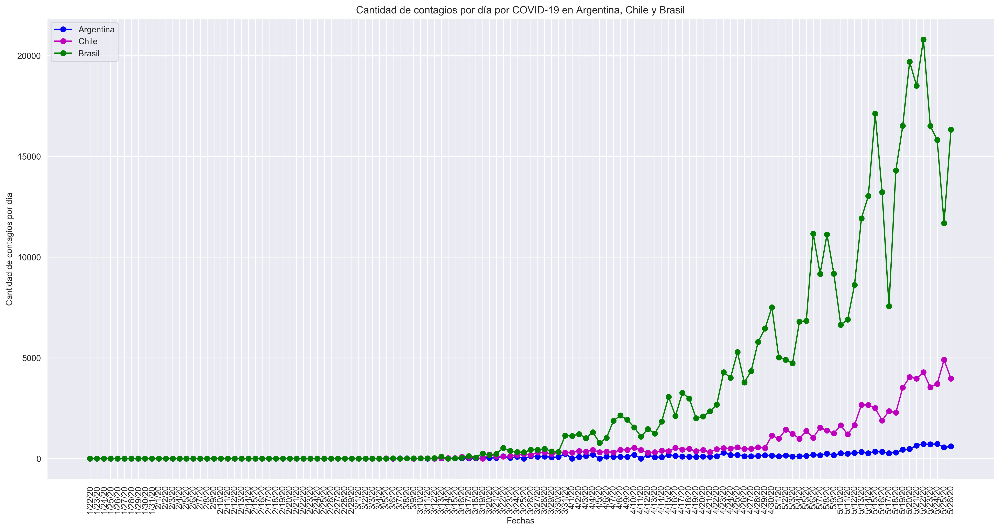

In [1945]:
#Graficos de cantidad de contagios por día

plt.figure(figsize= (20,10), dpi=300)
plt.plot(argentina_cases.index, cases_south["Argentina_day"] , "-o", label = "Argentina" , c="b")
plt.plot(chile_cases.index, cases_south["Chile_day"] , "-o" , label = "Chile", c="m")
plt.plot(brazil_cases.index, cases_south["Brazil_day"] , "-o" ,label = "Brasil", c="g")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Cantidad de contagios por día por COVID-19 en Argentina, Chile y Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Vemos que como Brasil tiene un número de contagios tan alto no se puede llegar a apreciar los números de Argentina ni Chile por lo que vamos a ver los gráficos por separado.

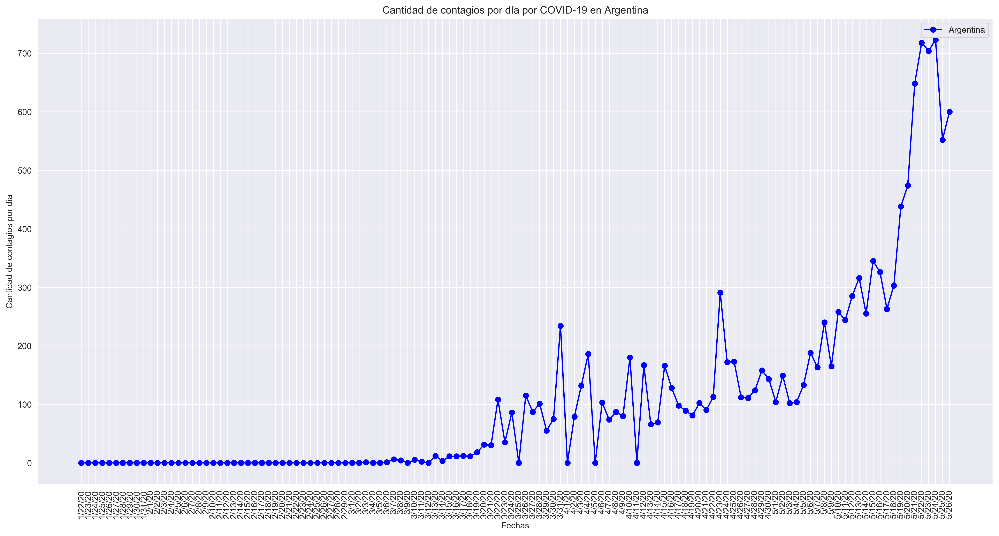

In [1946]:
#Gráfico de contagios por día en Argentina

plt.figure(figsize= (20,10), dpi=300)
plt.plot(argentina_cases.index, cases_south["Argentina_day"] , "-o", label = "Argentina", color= "b")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Cantidad de contagios por día por COVID-19 en Argentina")
plt.xticks(rotation=90)
plt.legend()
plt.show()

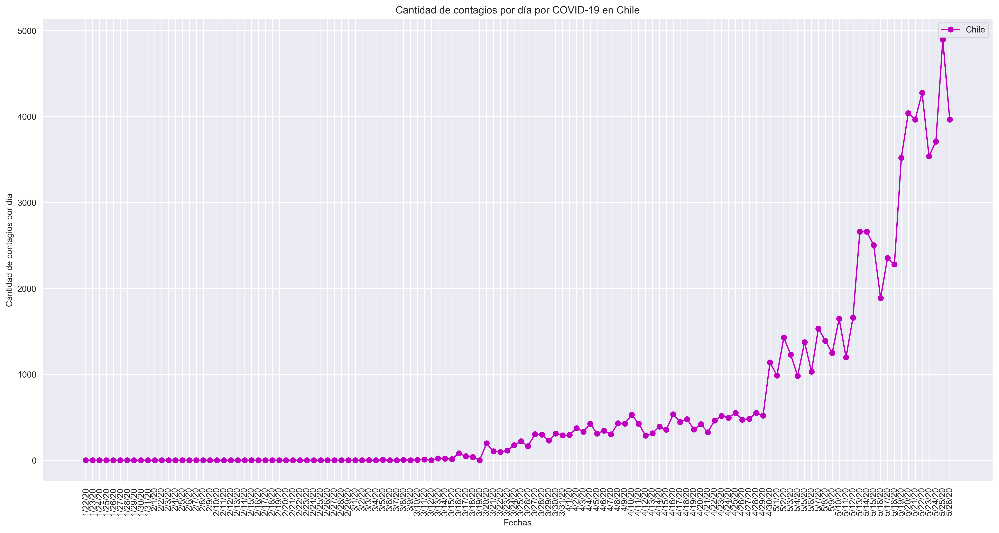

In [1947]:
#Gráfico de contagios por día en Chile

plt.figure(figsize= (20,10), dpi=300)
plt.plot(chile_cases.index, cases_south["Chile_day"] , "-o", label = "Chile", c="m")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Cantidad de contagios por día por COVID-19 en Chile")
plt.xticks(rotation=90)
plt.legend()
plt.show()

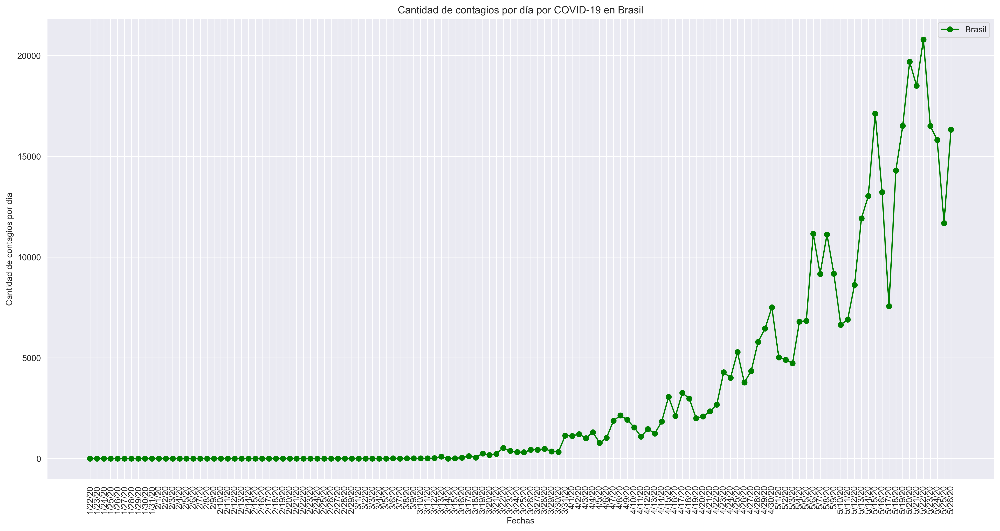

In [1948]:
#Gráfico de contagios por día en Brasil

plt.figure(figsize= (20,10), dpi=300)
plt.plot(brazil_cases.index, cases_south["Brazil_day"] , "-o", label = "Brasil", c="g")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Cantidad de contagios por día por COVID-19 en Brasil")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### En este caso estamos queriendo ver si podemos predecir qué cantidad de nuevos contagios por covid-19 se darán de un día para otro. 

#### En base a lo analizado para el caso de las muertes por día por COVID-19, vamos a definir una función donde se pueda seleccionar un día y la cantidad de días a considerar en el análisis de los contagios, y así poder determinar cuál es la cantidad de días óptimo a elegir para nuestro análisis. 

#### Voy a utilizar las mismas herramientas que antes sólo que adaptándolas al dataframe confirmed_cases y ver si nos da algún resultado interesante en sentido de buena proximidad a los casos reales. 

#### Hay que tener en cuenta que es mucho más complicado manipular los datos de contagios que los de muerte. Hay muchos factores a tener en cuenta y nuestra información es muy acotada en ese sentido. Información que sería relevante para el análisis sería saber cada cuánto tiempo se duplican los casos de contagio en cada país, las medidas tomadas en cada país desde el principio de la pandemia y cómo se manejan actualmente. Igualmente, vamos a probar si nuestro sistema predictivo se adapta a los datos y así analizar más profundamente qué datos podrían ayudar a su mejora.

#### Realizaremos esto en cada país.

### 4.2.1 - Argentina <a id="4.2.1"></a>

Definimos la función $time$ la cual es igual a la función $date$ del caso anterior pero ahora midiendo la cantidad de contagios desde un determinado día y analizando cierta cantidad de días anteriores.

In [1949]:
def time(selected_day, m):
    indice_comienzo = selected_day - m
    indice_fin = selected_day 
    if indice_comienzo >= len(cases_south["Argentina_day"]):
        return print("No quedan más días")
    elif indice_fin > len(cases_south["Argentina_day"]):
        return cases_south["Argentina_day"].iloc[indice_comienzo : len(cases_south["Argentina_day"])]
    else:
        return cases_south["Argentina_day"].iloc[indice_comienzo : indice_fin]

Definimos la función que predecirá la cantidad de contagios de un día para el otro usando la mediana y dando la desviación de número de contagios.

In [1950]:
def argentina_next_day(selected_day,m):
    print(f"El número de contagios será de {int(np.median(time(selected_day,m)))} con un error de +-{mad(time(selected_day,m))} personas contagiadas")

Definimos la función de predicción usando la mediana.

In [1951]:
def arg_prediction_next_day(i,m):
    return int(np.median(time(i,m)))

#Definimos la función que nos da la desviación de la mediana para luego tener el intervalo de confianza

def arg_interval_next_day(i,m):
    return mad(time(i,m))

Definimos la función que, dependiendo de la cantidad de días a analizar, nos devolverá las listas de las predicciones y de las desviaciones con el cálculo de la mediana.

In [1952]:
def arg_time_prediction(m):
    arg_prediction=[]
    for i in range(len(cases_south["Argentina_day"])):
        if i < m:
            arg_prediction.append(0)
        else:
            arg_pred = arg_prediction_next_day(i , m)
            arg_prediction.append(arg_pred)
    return arg_prediction

#Hacemos lo mismo para la desviación absoluta de la mediana

def arg_interval_prediction(m):
    arg_int_prediction=[]
    for i in range(len(cases_south["Argentina_day"])):
        if i < m:
            arg_int_prediction.append(0)
        else:
            arg_int_pred = arg_interval_next_day(i , m)
            arg_int_prediction.append(arg_int_pred)
    return arg_int_prediction

Vamos a calcular el óptimo $m$ para predecir la cantidad de contagios en Argentina. 

Consideramos nuevamente nuestros datos hasta el 30 de Abril.

In [1953]:
for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(cases_south["Argentina_day"].iloc[0: 100], arg_time_prediction(m)[0:100]))

21.63
20.53
21.36
19.14
19.7
19.78
20.31
20.22


#### Tenemos que el mejor $m$ es $m=6$. 

#### De igual forma, ya podemos ver como la predicción está bastante diferida de los datos reales ya que al usar la función dif_mean nos está devolviendo números mayores que 19 cuando antes, en el caso de las muertes, no pasaba de 1.6. 



#### Vamos a ver el gráfico.

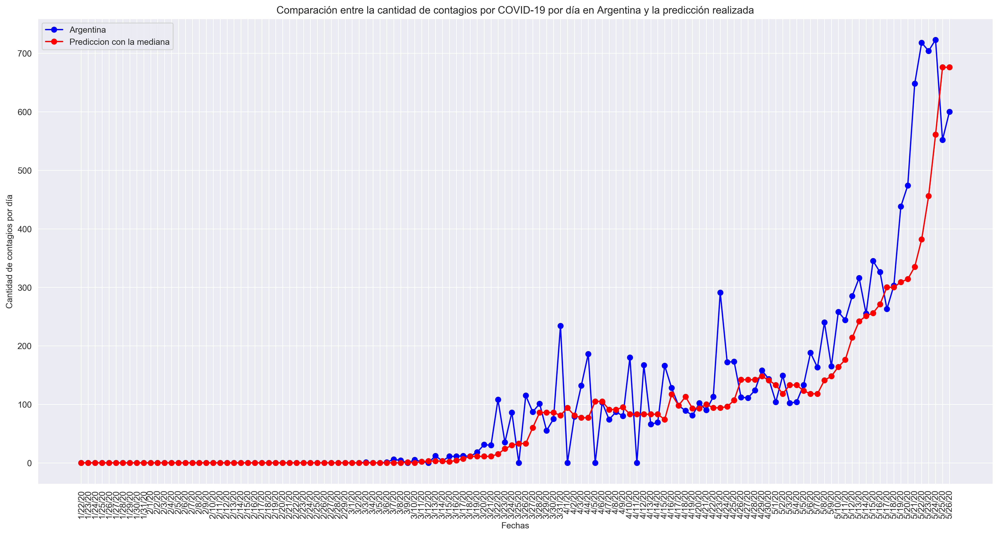

In [1954]:
#Gráfico con una predicción basada en el análisis de 6 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(argentina_cases.index, cases_south["Argentina_day"] , "-o", label = "Argentina", color="b")
plt.plot(argentina_cases.index, arg_time_prediction(6) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Comparación entre la cantidad de contagios por COVID-19 por día en Argentina y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### El gráfico muestra una tendencia creciente que acompaña a los datos reales pero, como dijimos antes, hay muchos más factores a tener en cuenta al analizar los casos de contagios por lo que era esperable que la aproximación no haya sido tan certera.


Veamos que sucede con los casos acumulados

In [1955]:
print(f"Se predice que habrá un total de {sum(arg_time_prediction(6))} casos de contagios en Argentina con un error de {sum(arg_interval_prediction(6))} contagios")


Se predice que habrá un total de 10676 casos de contagios en Argentina con un error de 2194 contagios


In [1956]:
#Veamos cuál es el número real
cases_south.tail(2)

,Argentina,Chile,Brazil,Argentina_day,Chile_day,Brazil_day
5/25/20,12628,73997,374898,552,4895,11687
5/26/20,13228,77961,391222,600,3964,16324


#### El número real quedó fuera de nuestro intervalo de confianza, lo cuál es esperable por las diferencias marcadas en el gráfico.

### 4.2.2 - Chile <a id="4.2.2"></a>

In [1957]:
def chi_time(selected_day, m):
    indice_comienzo = selected_day - m
    indice_fin = selected_day 
    if indice_comienzo >= len(cases_south["Chile_day"]):
        return print("No quedan más días")
    elif indice_fin > len(cases_south["Chile_day"]):
        return cases_south["Chile_day"].iloc[indice_comienzo : len(cases_south["Chile_day"])]
    else:
        return cases_south["Chile_day"].iloc[indice_comienzo : indice_fin]

Definimos la función que predecirá la cantidad de contagios de un día para el otro usando la mediana y dando la desviación de número de contagios.

In [1958]:
def chile_next_day(selected_day,m):
    print(f"El número de contagios será de {int(np.median(chi_time(selected_day,m)))} con un error de +-{mad(chi_time(selected_day,m))} personas contagiadas")

Definimos la función de predicción usando la mediana

In [1959]:
def chi_prediction_next_day(i,m):
    return int(np.median(chi_time(i,m)))

#Definimos la función que nos da la desviación de la mediana para luego tener el intervalo de confianza

def chi_interval_next_day(i,m):
    return mad(chi_time(i,m))

Calculamos la función que nos devuelve las listas de las predicciones dependiendo de la cantidad de días a analizar.

In [1960]:
def chi_time_prediction(m):
    chi_prediction=[]
    for i in range(len(cases_south["Chile_day"])):
        if i < m:
            chi_prediction.append(0)
        else:
            chi_pred = chi_prediction_next_day(i , m)
            chi_prediction.append(chi_pred)
    return chi_prediction

#Hacemos lo mismo para la desviación absoluta de la mediana

def chi_interval_prediction(m):
    chi_int_prediction=[]
    for i in range(len(cases_south["Chile_day"])):
        if i < m:
            chi_int_prediction.append(0)
        else:
            chi_int_pred = chi_interval_next_day(i , m)
            chi_int_prediction.append(chi_int_pred)
    return chi_int_prediction

In [1961]:
#Calculamos hasta el 30 de abril
for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(cases_south["Chile_day"].iloc[0: 100], chi_time_prediction(m)[0:100]))

35.26
35.91
37.16
36.76
37.19
38.3
40.78
42.2


#### El $m$ óptimo sería $m=3$. 

#### Al igual que en el caso de Argentina, vemos que dif_mean nos da una diferencia muy alta. 



#### Vamos a ver el gráfico.

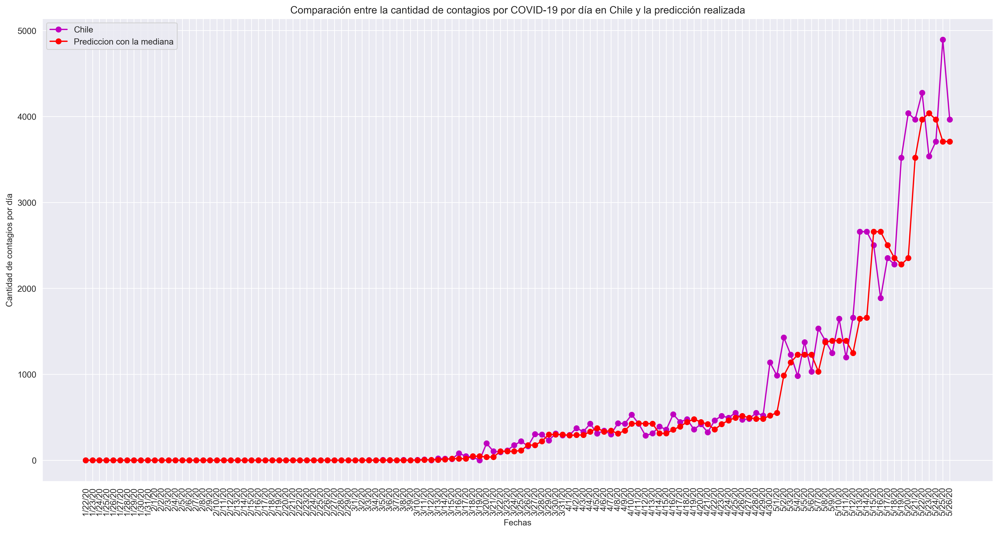

In [1962]:
#Gráfico con una predicción basada en el análisis de 3 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(chile_cases.index, cases_south["Chile_day"] , "-o", label = "Chile", color="m")
plt.plot(chile_cases.index, chi_time_prediction(3) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Comparación entre la cantidad de contagios por COVID-19 por día en Chile y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [1963]:
print(f"Se predice que habrá un total de {sum(chi_time_prediction(3))} casos de contagios en Argentina con un error de +-{sum(chi_interval_prediction(3))} contagios")

Se predice que habrá un total de 69342 casos de contagios en Argentina con un error de +-5117 contagios


In [1964]:
cases_south.tail(2)

,Argentina,Chile,Brazil,Argentina_day,Chile_day,Brazil_day
5/25/20,12628,73997,374898,552,4895,11687
5/26/20,13228,77961,391222,600,3964,16324


Al igual que en lo analizado para Argentina tenemos que el número de contagios de Chile quedá por fuera de nuestro intervalo de confinza.

### 4.2.3 - Brasil <a id="4.2.3"></a>

In [1965]:
def bra_time(selected_day, m):
    indice_comienzo = selected_day - m
    indice_fin = selected_day 
    if indice_comienzo >= len(cases_south["Brazil_day"]):
        return print("No quedan más días")
    elif indice_fin > len(cases_south["Brazil_day"]):
        return cases_south["Brazil_day"].iloc[indice_comienzo : len(cases_south["Brazil_day"])]
    else:
        return cases_south["Brazil_day"].iloc[indice_comienzo : indice_fin]

Definimos la función que predecirá la cantidad de contagios del día siguiente la mediana y dando la desviación de número de contagios.

In [1966]:
def brazil_next_day(selected_day,m):
    print(f"El número de contagios será de {int(np.median(bra_time(selected_day,m)))} con un error de +-{mad(bra_time(selected_day,m))} personas contagiadas")

Definimos la función de predicción que nos devuelve la mediana de los datos a considerar

In [1967]:
def bra_prediction_next_day(i,m):
    return int(np.median(bra_time(i,m)))

#Definimos la función que nos da la desviación de la mediana para luego tener el intervalo de confianza

def bra_interval_next_day(i,m):
    return mad(bra_time(i,m))

Definimos la función que nos devuelva las listas de predicciones dependiendo de la cantidad de días a analizar.

In [1968]:
def bra_time_prediction(m):
    bra_prediction=[]
    for i in range(len(cases_south["Brazil_day"])):
        if i < m:
            bra_prediction.append(0)
        else:
            bra_pred = bra_prediction_next_day(i , m)
            bra_prediction.append(bra_pred)
    return bra_prediction

#Hacemos lo mismo para la desviación absoluta de la mediana

def bra_interval_prediction(m):
    bra_int_prediction=[]
    for i in range(len(cases_south["Brazil_day"])):
        if i < m:
            bra_int_prediction.append(0)
        else:
            bra_int_pred = bra_interval_next_day(i , m)
            bra_int_prediction.append(bra_int_pred)
    return bra_int_prediction

In [1969]:
#Calculamos hasta el 30 de abril
for m in [3,4,5,6,7,8,9,10]:
    print(dif_mean(cases_south["Brazil_day"].iloc[0: 100], bra_time_prediction(m)[0:100]))

246.01
265.4
289.86
290.4
297.07
303.7
313.87
325.66


#### Brasil es el que tiene la peor aproximación, son muy grandes los números calculados con dif_mean. El óptimo $m$ sería $m=3$.

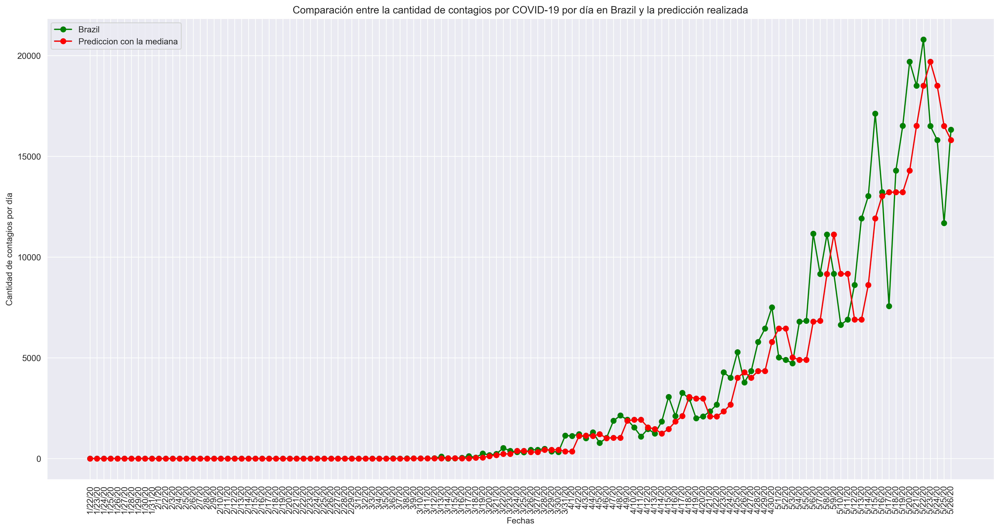

In [1970]:
#Gráfico con una predicción basada en el análisis de 3 días.
plt.figure(figsize= (20,10), dpi=300)

plt.plot(brazil_cases.index, cases_south["Brazil_day"] , "-o", label = "Brazil", color="g")
plt.plot(brazil_cases.index, bra_time_prediction(3) , "-o", label = "Prediccion con la mediana", color ="r")
plt.xlabel("Fechas")
plt.ylabel("Cantidad de contagios por día")
plt.title("Comparación entre la cantidad de contagios por COVID-19 por día en Brazil y la predicción realizada")
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [1971]:
print(f"Se predice que habrá un total de {sum(bra_time_prediction(3))} casos de contagios en Argentina con un error de {sum(bra_interval_prediction(3))} contagios")

Se predice que habrá un total de 359138 casos de contagios en Argentina con un error de 33937 contagios


In [1972]:
cases_south.tail(2)

,Argentina,Chile,Brazil,Argentina_day,Chile_day,Brazil_day
5/25/20,12628,73997,374898,552,4895,11687
5/26/20,13228,77961,391222,600,3964,16324


Nuevamente nos sucede lo mismo con Brasil y como dije antes, este es el que presenta la mayor diferencia entre los datos predichos y los reales.

# 5 - Ideas para mejoras  <a id="5"></a>

A lo largo de todo el análisis he dejado algunas ideas de cómo podríamos tener una mejor versión (en el sentido de precisión de datos y predicción). Vamos a enumerar a continuación esas ideas y volcar algunas nuevas.

Cuando analizamos el dataframe confirmed_cases para los casos de Argentina, Chile y Brasil sería de gran ayuda saber específicamente que tipo de medidas han ido tomando con respecto a la prevención y avance del virus, así podremos entender mejor los gráficos presentados. Una de las ideas fue revisar la cantidad de testeos que realiza cada país ya que encontrabamos un comportamiento extraño en los datos que refleja Chile con respecto a Brasil. 

Según el análisis el caso de muertes se pudo aproximar bastante bien utilizando la mediana de los datos a tener en cuenta. Para evitar el sobreajuste de los datos tomamos un porcentaje de los datos (habíamos considerado los datos hasta el 30 de abril) y luego vimos si la predicción se amoldaba a los datos reales que seguían. Encontramos que tenía un buen comportamiento pero para mejorar este tipo de modelaje lo que me gustaría poder hacer es seleccionar una cantidad de días en forma random y luego encontrar el número de días a analizar óptimo en base a eso. Esto creo que mejoraría la predicción ya que quizá hasta el mes de abril los números mostraban una tendencia que luego fue cambiando por otros factores, los cuales podrían ser: cambios en las políticas restrictivas, mayor exposición de habitantes ante el virus, cambios de clima, etc. Por lo que, creo que al considerar aleatoriamente un porcentaje de días y modelar la predicción con ello podré mejorar la aproximación realizada.

Como vimos en los gráficos, la aproximación del número de muertes no siempre es acertada pero sigue una tendencia muy parecida. En base a esto quizá se podría pensar en predecir una cantidad de muertes acumulada a lo largo de una semana. Es decir, se selecciona un día y se arma una función predictiva que, desde ese día, cuente una semana y nos de el total de muertes que habrá luego de esa semana.  


Con respecto al número de contagios creo que sería un modelaje mucho más complejo. Deberíamos tener acceso a todo lo mencionado anteriormente, pero además saber más acerca del virus que está siendo estudiado. Ver en cuánto tiempo se duplican los casos, sabemos que hay muchos personas que contraen el virus pero son asintomáticas, por que lo que no sabemos que cantidad real hay de contagios a menos que se hagan todos los testeos necesarios. 


Otro análisis que me resulta interesante pensar es el siguiente: contando la cantidad de contagios por día (respectivamente muertes por día) calcular el promedio de los días en que se llegó al pico de contagios (resp. muertes) en todos los países. Teniendo esto podríamos saber en qué día (contado desde el 22 de enero) es que se espera el pico de contagios. Hay países que quizá ya pasaron por su pico de contagios o muertes y otros que no, por lo que sería interesante poder estimar la cantidad de días en la que se espera que suceda el pico. 
